## Felipe Cadar Chamone

Um dos pilares da visão computacional é a detecção e descrição de pontos de interesse, ou __keypoints__, em imagens. Esses pontos são coordenas no domínio da imagem onde existe informações visuais importantes sobre a cena. O objetivo desses pontos é que um detector os encontre independente do ponto de vista da imagem, isso se chama repetibilidade. Cada ponto é associado a um descritor, que é um vetor de __features__ que condensa informações sobre a estrutura representada pelo keypoint.

A correspondência de pontos de interesse entre duas imagens é fundamental para inúmeras tarefas de visão computacional, como busca por imagem, rastreamento de objetos, fluxo ótico, mapa de disparidade, _Structure from Motion_, etc. Os descritores e detectores atuais, como SIFT e R2D2 , trabalham com características visuais locais e como podemos corresponder elas. Apesar de parecer ser tudo que precisamos para fazer essa correspondência, a maioria das metodologias têm dificuldade com regiões homogêneas e padrões repetidos, gerando descritores ambíguos. Para melhorar a correspondência de keypoints, é essencial que consigamos detectar com repetibilidade e descrever com discriminação e invariância. O ser humano  é capaz de diferenciar regiões muito semelhantes analisando o contexto, como a qual objeto essa região pertence ou a posição relativa de um ponto ao objeto inteiro. Podemos chamar de semântica essa informação extra que foge a simples características visuais como a textura. Complementar os métodos de descrição e detecção com informação semântica é o próximo passo em direção ao desenvolvimento de técnicas que performem similares aos humanos.

Atualmente poucos métodos de correspondência incluem informação semântica no processo de detecção e descrição de pontos de interesse, e os que incluem tratam tarefas muito específicas, como correspondência de alguns objetos , ou tarefas puramente semânticas, como a correspondência de objetos diferentes porém pertencentes a mesma classe. Por existir poucos trabalhos que trabalham com semântica, e praticamente nenhum que a use em sem fortes restrições, gostaríamos de validar o uso conjunto da semântica e das informações de textura. A hipótese deste projeto é: __A inclusão de informação semântica no processo de descrição de keypoints melhora a performance da correspondência de pontos de interesse.__

## Modelo Proposto

O ponto de partida de um projeto como esse seria conseguir extrait features semnânticas de uma imagem qualquer. Para isso deci usar uma rede de segmentação semantica e estrair as features anteriores a camada de classificação. A ideia é que, como a rede conhece o signoficado dos pixels em um conexto, seria interessante unir as features desta classificação com um descritor visual popular, como o SIFT.

A arquitetura proposta então é composta de dois extratores: Semântico e Visual. Quando o modelo recebe uma imagem, o extrator visual detecta Keypoints e calcula os descritores de cada ponto. Logo em seguida o extrador semântico extrai um mapa denso de features da imagem. Como esse mapa é espacialmente menor, o método faz uma interpolação bilinear para o tamanho da imagem, então selecionamos as features correspondentes aos keypoints detectados. Para unir as duas informações o método simplesmente concatena os respectivos descritores. Para controlar a proporção de cada informação o método interpola os vetores para um tamanho desejado, de modo que a proporção dos dois descritores somem 1 e o vetor final possua __128d__.

Abaixo segue a implementação do método proposto.

In [1]:
from tqdm import tqdm
import utils.io as io, utils.hpatches as hpatches, utils.features as features
import matplotlib.pyplot as plt
import os

In [2]:
import torch
from torch import nn
from torch.nn import functional as F
import kornia as K
import torchvision
from torchvision import transforms
import numpy as np
import time
import cv2

class NaiveSemantic():
    def __init__(self, model='deeplabv3_mobilenet_v3_large', contrastThreshold=0.04, edgeThreshold=10):

        self.device = torch.device('cpu')
        if torch.cuda.is_available():
            self.device = torch.device('cuda:0')
        
        weights = torchvision.models.segmentation.DeepLabV3_MobileNet_V3_Large_Weights.DEFAULT
        self.localExtractor = cv2.SIFT_create(nfeatures=0, contrastThreshold=contrastThreshold, edgeThreshold=edgeThreshold, nOctaveLayers=3)
        self.semanticExtractor = torch.hub.load('pytorch/vision:v0.10.0', model, weights=weights).eval().to(self.device)
        self.semanticExtractor.classifier = nn.Sequential(*list(self.semanticExtractor.classifier.children())[:-1])
        self.semanticExtractor.aux_classifier = nn.Sequential(*list(self.semanticExtractor.aux_classifier.children())[:-2])

        self.preprocess = transforms.Compose([
            transforms.ToTensor(),
            transforms.Lambda(lambda x: K.color.bgr_to_rgb(x)),
            transforms.Lambda(lambda x: x.to(self.device)),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            transforms.Resize(799, max_size=800)
        ])

    def semanticMap(self, img):
        input_tensor = self.preprocess(img)
        input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model

        with torch.no_grad():
            torch.cuda.empty_cache()
            output = self.semanticExtractor(input_batch)['out'][0]
            
        return output

    def extractSemantic(self, img, np_kps):

        output = self.semanticMap(img)
        output = F.interpolate(output.unsqueeze(0), size=(img.shape[0], img.shape[1]), mode='bilinear', align_corners=True).squeeze(0)

        semantic_features = output[:, np_kps[:,1], np_kps[:, 0]].T.cpu().numpy()
        semantic_features = semantic_features / np.max(semantic_features, axis=1)[:, np.newaxis]
        
        return semantic_features

    def detectAndCompute(self, img, opt=None):
        if len(img.shape) == 3:
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        else:
            gray = img
            
        kps, local_features = self.localExtractor.detectAndCompute(gray, opt)
        if len(kps) == 0:
            return [], []
        
        np_kps = np.array([[kp.pt[0], kp.pt[1]] for kp in kps]).astype(int)
        local_features = local_features/local_features.max()

        semantic_features = self.extractSemantic(img, np_kps)
        features = np.hstack([local_features, semantic_features])

        return kps, features


O código abaixo faz o ajuste de proporção de informação entre os descritores.

In [3]:
def adjustDesc(desc, proportion):
    if len(desc) == 0:
        return []

    visual = desc[:, :128]
    semantic = desc[:, 128:]
    
    new_total = 128
    semantic_size = int(new_total*proportion)
    visual_size = new_total - semantic_size

    if visual_size > 0:
        new_visual = cv2.resize(visual,     (visual_size, visual.shape[0]))
    
    if semantic_size > 0:
        new_semantic = cv2.resize(semantic, (semantic_size, semantic.shape[0]))

    if visual_size == 0:
        return new_semantic
    
    if semantic_size == 0:
        return new_visual

    new_desc = np.concatenate([new_visual, new_semantic], axis=1)

    return new_desc

## Avaliação

Métricas muito comuns na área de correspondência de keypoints são:
- Mean Match Accuracy (MMA)
- Matching Score (MS)

O MMA é calculado como `#Matches corretos/ #Total de Matches`

O MS é calculado como `#Matches corretos/ #Total de Pontos Detectados`

Para determinar se dois pontos são correspondentes podemos usar a estratégia de KNN, avaliando quais são os descritores mais proximos com uma métrica de distância, como a Norma L2. Para evitar correspondências ambíguas, apenas consideramos um Match quando a distância do vizihno mais próximo é mais 90% menor que a distância para o segundo vizinho mais próximo.

In [15]:
bf = cv2.BFMatcher()

def makeMatch(kps1, desc1, kps2, desc2, idx=False, dmatch=False):

    if len(desc1) == 0 or len(desc2) == 0:
        if dmatch:
            return dmatches
        return [], []

    matches = bf.knnMatch(desc1,desc2,k=2)

    mkpts1 = []
    mkpts2 = []
    # Apply ratio test
    idx1 = []
    idx2 = []
    dmatches = []
    for m,n in matches:
        if m.distance < 0.9*n.distance:
            dmatches.append(m)
            mkpts1.append(kps1[m.queryIdx])
            mkpts2.append(kps2[m.trainIdx])
            idx1.append(m.queryIdx)
            idx2.append(m.trainIdx)
    if dmatch:
        return dmatches

    if idx:
        return np.array(idx1), np.array(idx2)

    return np.array(mkpts1), np.array(mkpts2)

In [16]:
def evalMatch(mkpts2, gtkpts, total, K=10):
    if len(mkpts2) == 0:
        return np.zeros(K), np.zeros(K)

    diff = mkpts2.astype(int) - gtkpts.astype(int)
    diff = np.linalg.norm(diff, axis=1)
    
    ms = np.zeros(K)
    mma = np.zeros(K)
    for i, k in enumerate(range(K)):
        acc_at_k = (np.abs(diff) <= k).sum()
        ms[i] = acc_at_k/total
        mma[i] = acc_at_k/len(mkpts2)

    return ms, mma

## Dataset 

Para obter avaliações dos métodos foi usado um dataset bem popular da àrea, chamado HPatches, proposto na conferência CVPR de 2017. Essa base de dados é constituida de 58 sequências de 6 imagens, onde conhecemos a transformação da primeira imagem para as outras 5 da sequência. Essas sequências são separadas em dois tipos de dados, o primeiro contêm apenas variações de ponto de vista (chamados de viewpoint) e o segundo apenas variações de iluminação (chamados de illumination).

### Exemplo

Aqui vamos instanciar o modelo implementado e testar em alguns pares de imagens 

In [17]:
model = NaiveSemantic()

Using cache found in /Users/cadar/.cache/torch/hub/pytorch_vision_v0.10.0


__Primeiro com varição de ponto de vista__

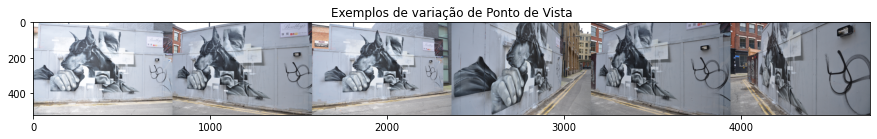

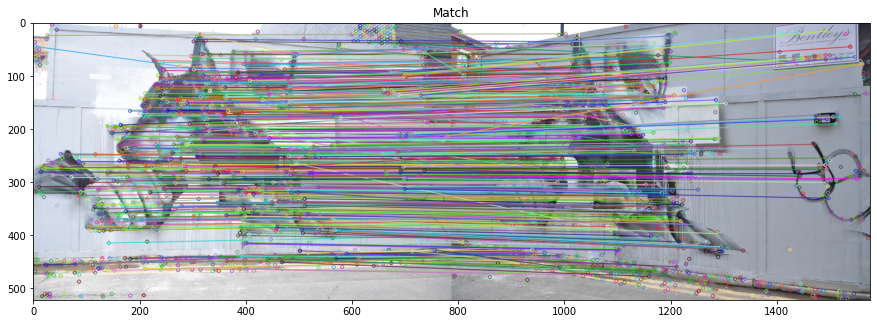

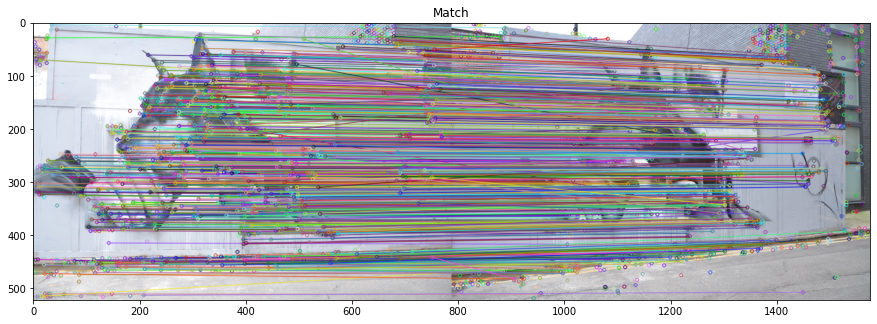

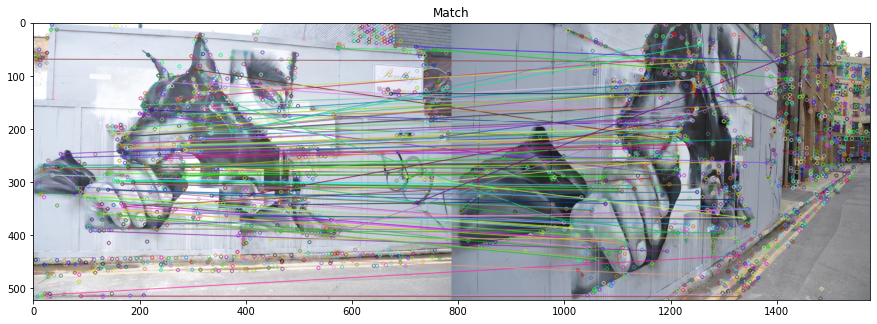

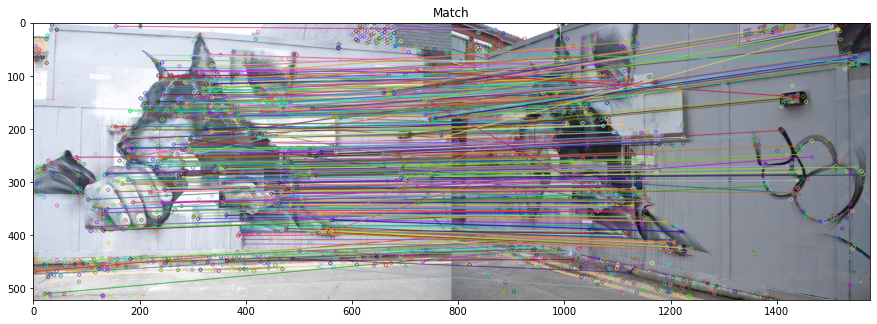

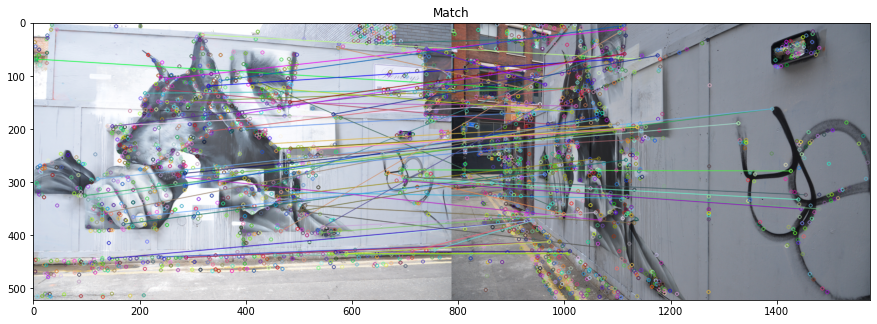

In [18]:
sequence = 'v_dogman'
imgs = [cv2.imread(f"example/{sequence}/{i}.ppm") for i in range(1, 7)]

stack = np.concatenate(imgs, 1)
plt.figure(figsize=[15, 10])
plt.imshow(cv2.cvtColor(stack, cv2.COLOR_BGR2RGB))
plt.title("Exemplos de variação de Ponto de Vista")
plt.show()

master_kps_cv, master_descs = model.detectAndCompute(imgs[0], None)
master_descs = adjustDesc(master_descs, 0.5)
master_kps_np = features.cvToNp(master_kps_cv)

for tgt in imgs[1:]:
    tgt_kps_cv, tgt_descs = model.detectAndCompute(tgt, None)
    tgt_descs = adjustDesc(tgt_descs, 0.5)
    tgt_kps_np = features.cvToNp(tgt_kps_cv)

    dmatch = makeMatch(master_kps_np, master_descs, tgt_kps_np, tgt_descs, dmatch=True)

    matched_img = cv2.drawMatches(imgs[0], master_kps_cv, tgt, tgt_kps_cv, dmatch, None)
    plt.figure(figsize=[15, 10])
    plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
    plt.title("Match")
    plt.show()

__E também com  variação de iliminação

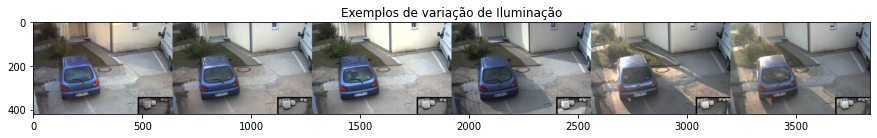

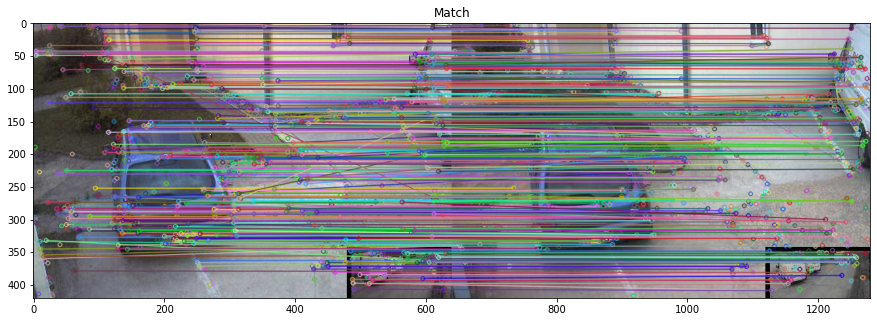

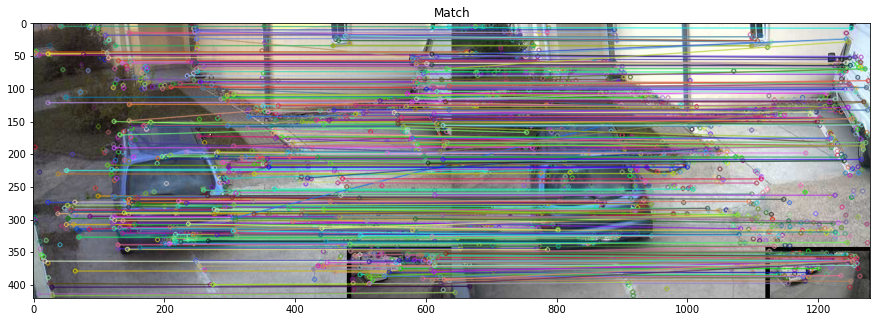

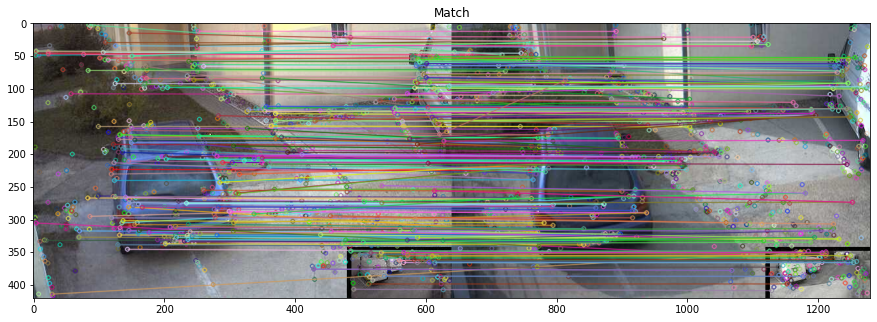

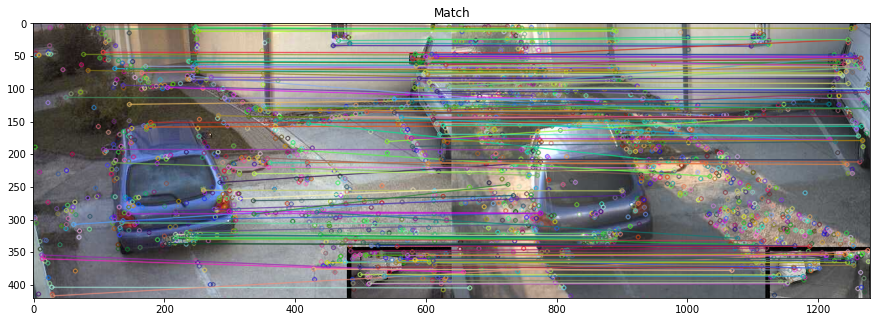

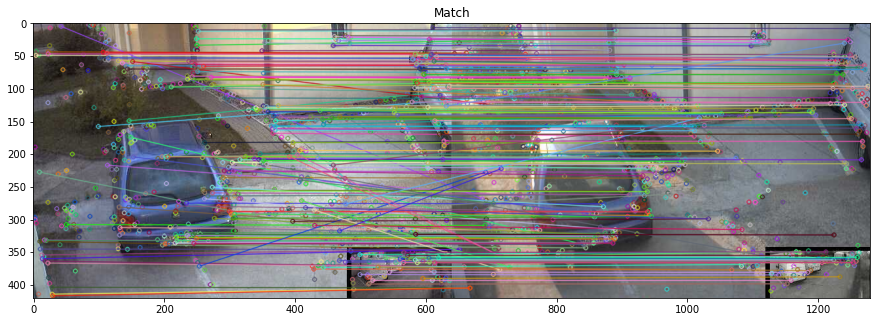

In [19]:
sequence = 'i_parking'
imgs = [cv2.imread(f"example/{sequence}/{i}.ppm") for i in range(1, 7)]

stack = np.concatenate(imgs, 1)
plt.figure(figsize=[15, 10])
plt.imshow(cv2.cvtColor(stack, cv2.COLOR_BGR2RGB))
plt.title("Exemplos de variação de Iluminação")
plt.show()

master_kps_cv, master_descs = model.detectAndCompute(imgs[0], None)
master_descs = adjustDesc(master_descs, 0.5)
master_kps_np = features.cvToNp(master_kps_cv)

for tgt in imgs[1:]:
    tgt_kps_cv, tgt_descs = model.detectAndCompute(tgt, None)
    tgt_descs = adjustDesc(tgt_descs, 0.5)
    tgt_kps_np = features.cvToNp(tgt_kps_cv)

    dmatch = makeMatch(master_kps_np, master_descs, tgt_kps_np, tgt_descs, dmatch=True)

    matched_img = cv2.drawMatches(imgs[0], master_kps_cv, tgt, tgt_kps_cv, dmatch, None)
    plt.figure(figsize=[15, 10])
    plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
    plt.title("Match")
    plt.show()

## Resultados Quantitativos

Abaixo podemos ver quatro gráficos, os dois primeiro possuem resultados de Mean Match Score para os dois tipos de dados: Alteração de iluminação (illumination) e alteração de ponto de vista (viewpoint). Os dois seguintes possuem as mesmas comparações, porém para a métrica Matching Score.

Para o cálculo das métricas é comum considerar se uma correspondência é correta quando está perto o suficiente do ponto. No gráfico variamos esse limite de 0 a 10 pixels de diferença para considerar um match correto.

Também foi incluído nos gráficos outras versões onde o parâmetro "P", da proporção entre a informação semantica e visual, é alterado.

Notamos que o método proposto se posiciona muito acima do competidor SIFT para todos os limites de pixel. Podemos ver também que quando usamos mais informação semântica do que o necessário, perdemos performance.

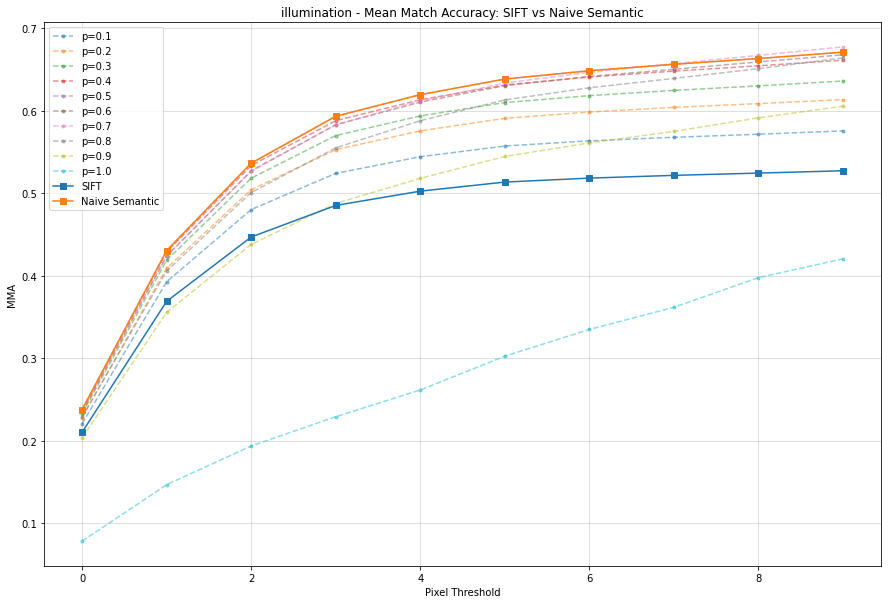

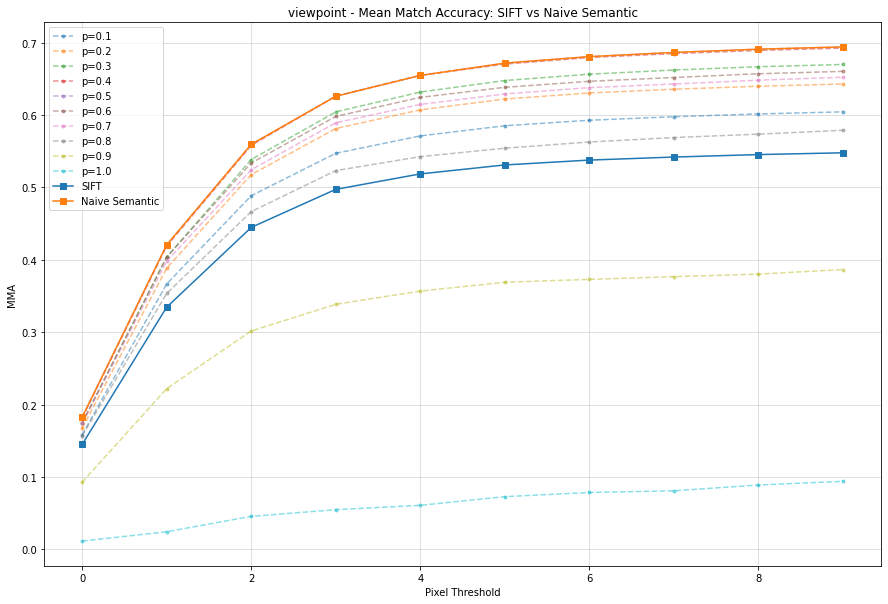

In [64]:
import glob

for data_type in ["illumination", "viewpoint"]:
    results_files = glob.glob(f"resultados/results_mma/{data_type}_naivesemantic-*_np.txt")
    all_results = {}
    
    for path in results_files:
        p = path.split('-')[-1].split("_")[1]
        results = np.loadtxt(path)
        means = results.mean(0)
        all_results[p] = means
        
    sift_results = all_results['0.0']
    semantic_results = all_results['0.5']

    plt.figure(figsize=[15,10])
    for p in ['0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9', '1.0']:
        plt.plot(all_results[p], label=f"p={p}", marker='.', linestyle='--', alpha=0.5)

    plt.plot(sift_results, label="SIFT", marker='s')
    plt.plot(semantic_results, label="Naive Semantic", marker='s')
    plt.xlabel("Pixel Threshold")
    plt.ylabel("MMA")
    plt.title(f"{data_type} - Mean Match Accuracy: SIFT vs Naive Semantic")
    plt.grid(True, alpha=.5)
    plt.legend()
    plt.show()

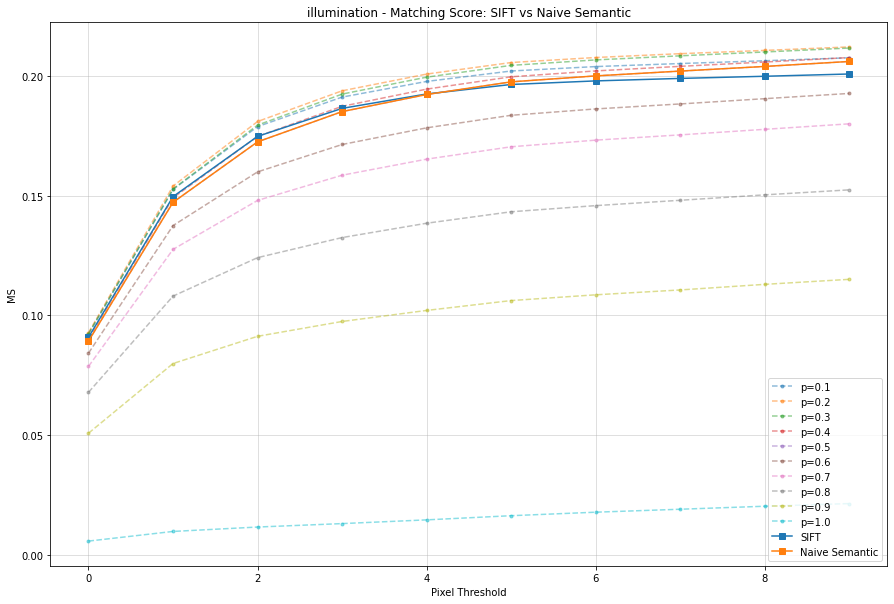

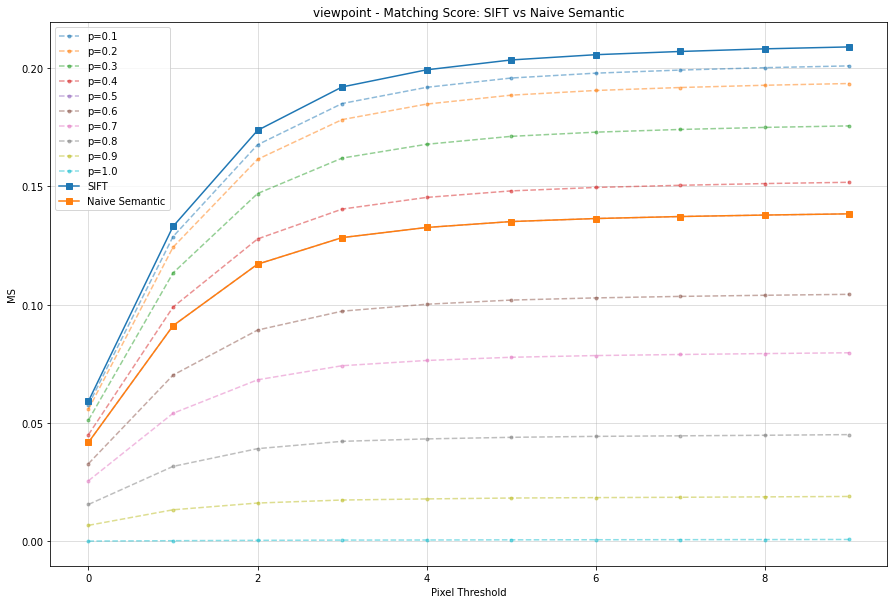

In [65]:
for data_type in ["illumination", "viewpoint"]:
    results_files = glob.glob(f"resultados/results_ms/{data_type}_naivesemantic-*_np.txt")
    all_results = {}
    
    for path in results_files:
        p = path.split('-')[-1].split("_")[1]
        results = np.loadtxt(path)
        means = results.mean(0)
        all_results[p] = means
        
    sift_results = all_results['0.0']
    semantic_results = all_results['0.5']

    plt.figure(figsize=[15,10])
    for p in ['0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9', '1.0']:
        plt.plot(all_results[p], label=f"p={p}", marker='.', linestyle='--', alpha=0.5)

    plt.plot(sift_results, label="SIFT", marker='s')
    plt.plot(semantic_results, label="Naive Semantic", marker='s')
    plt.xlabel("Pixel Threshold")
    plt.ylabel("MS")
    plt.title(f"{data_type} - Matching Score: SIFT vs Naive Semantic")
    plt.grid(True, alpha=.5)
    plt.legend()
    plt.show()

## Resultados Qualitativa

Aqui mostramos os matches para diferentes valores de proporção entre tipos de inforação. Temos 0.0 como apenas informação visual, vulgo SIFT, e 1.0 como apenas informação Semântica.

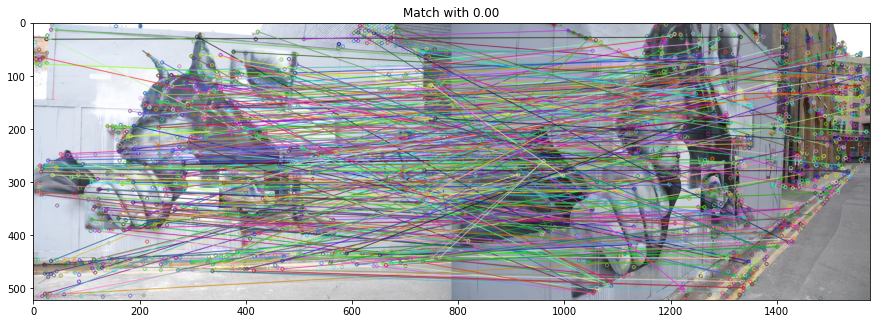

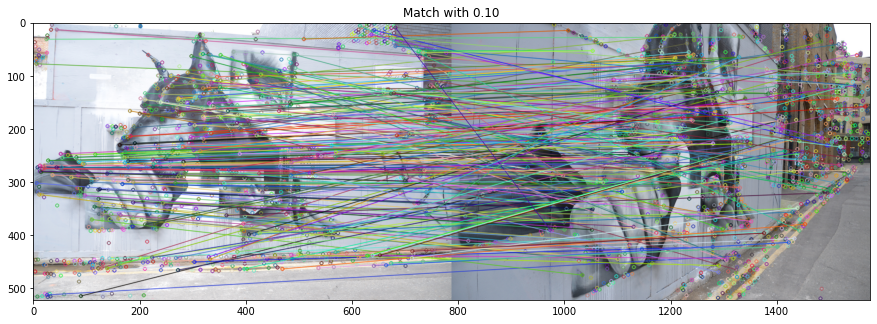

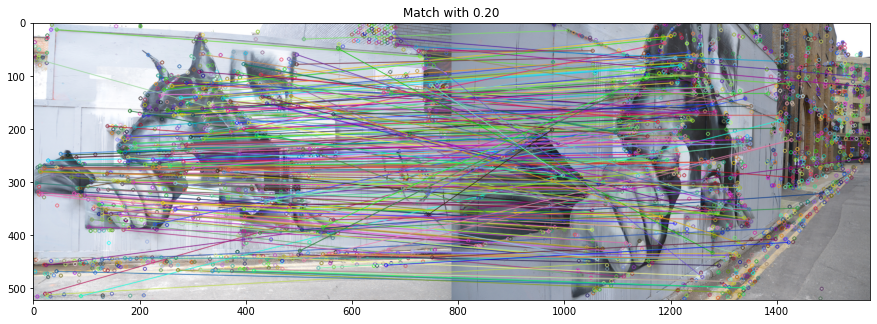

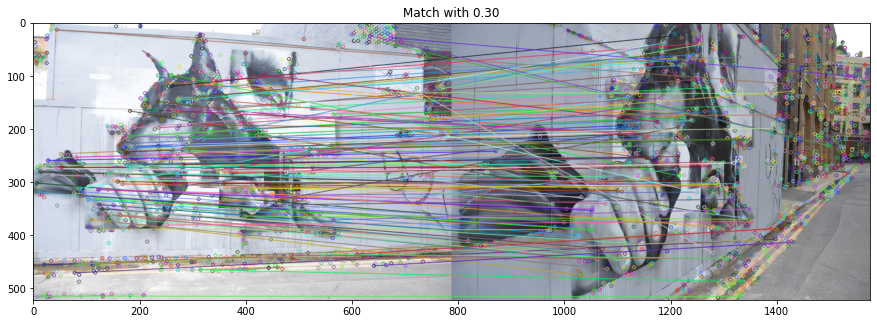

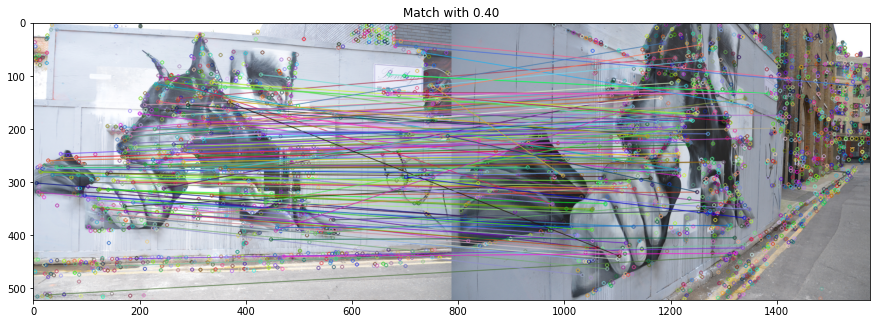

...

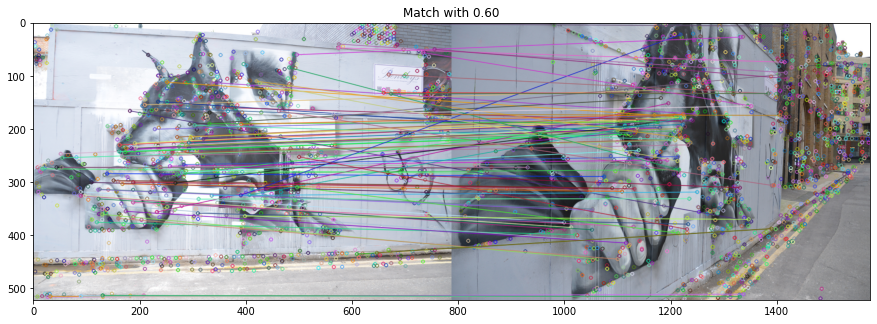

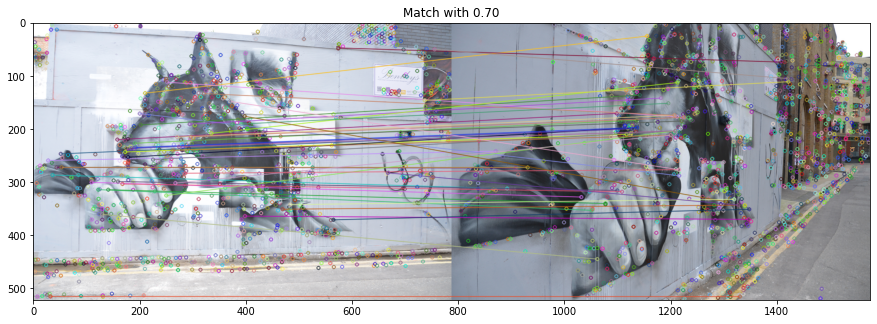

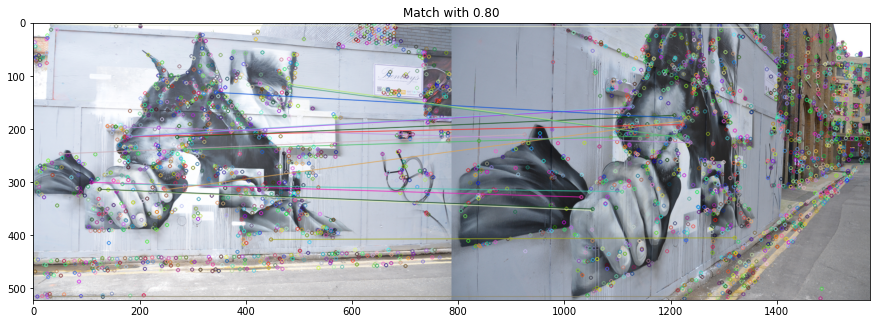

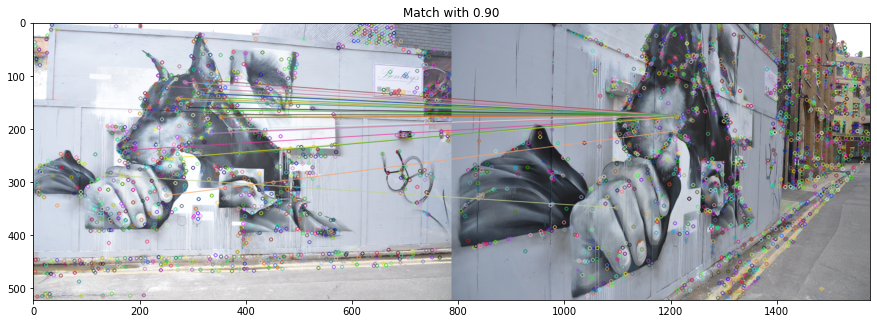

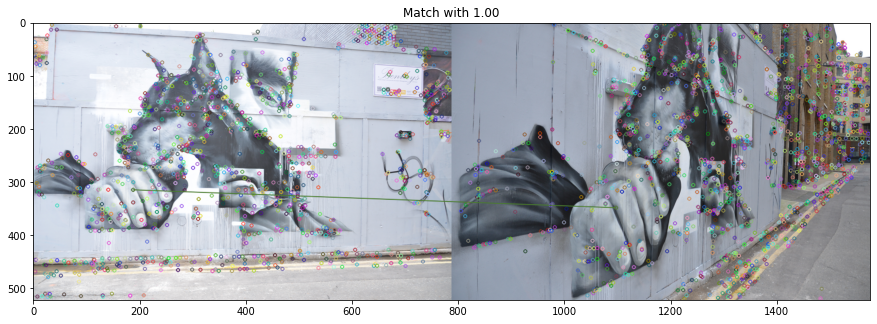

In [13]:
sequence = 'v_dogman'
imgs = [cv2.imread(f"example/{sequence}/{i}.ppm") for i in range(1, 7)]
tgt = imgs[3]

master_kps_cv, master_descs = model.detectAndCompute(imgs[0], None)
master_kps_np = features.cvToNp(master_kps_cv)

tgt_kps_cv, tgt_descs = model.detectAndCompute(tgt, None)
tgt_kps_np = features.cvToNp(tgt_kps_cv)

for p in np.linspace(0, 1, 11):
    tmp_master_descs = adjustDesc(master_descs, p)
    tmp_tgt_descs = adjustDesc(tgt_descs, p)

    dmatch = makeMatch(master_kps_np, tmp_master_descs, tgt_kps_np, tmp_tgt_descs, dmatch=True)

    matched_img = cv2.drawMatches(imgs[0], master_kps_cv, tgt, tgt_kps_cv, dmatch, None)
    plt.figure(figsize=[15, 10])
    plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
    plt.title(f"Match with proportion = {p:.2f}")
    plt.show()

Os resultados anteriores são muito interessantes pois nos mostra como a informação semância é tanto capaz de ajudar como atrapalhar a correspondência. 

A imagem abaixo mostra uma comparação entre os descritores de dois patches. Nesta imagem usamos o Naive Semantic com `p=0.5`, então a primeira metado dos descritores é puramente visual, e a segunda metado é semantica.

Podemos notar que, por serem patches visualmente diferentes, os descritores visuais são levemente inconpatíveis também. O interessante aqui é que semanticamente os dois matches representam uma parede de uma contrução, por esse motivo a parte semântica dos descritores são muito compatíveis.

![alt](./resultados/side_by_side/2_0_0.5.png)

Neste segundo exmplo podemos notar uma variação forte de ponto de vista no patch, onde a classificação semantica ajudou para determinar como uma correspondência.

![alt](./resultados/side_by_side/5_17_0.5.png)


